### Imports

In [31]:
import pandas as pd 
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from textblob import TextBlob
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.preprocessing import StandardScaler, LabelEncoder
from snorkel.labeling import labeling_function
from snorkel.labeling.model import LabelModel
from snorkel.labeling import PandasLFApplier
from snorkel.augmentation import transformation_function
from snorkel.augmentation import ApplyOnePolicy, PandasTFApplier
import random
from nltk.corpus import wordnet as wn
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
from transformers import pipeline
from spellchecker import SpellChecker
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/ben/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [8]:
# Load the pre-trained model from the .h5 file
model_path = "model_11_72test.h5" # Best Performing - Currently Set
model_path2 = "model_11_neg_words.h5" # new try after edits / sentiment scores not as closely aligning to Vader as best performing
# Insert your relative path here
model = tf.keras.models.load_model('/Users/ben/Desktop/DSI_GA_Materials/capstone/Capstone_Project_backup/model_11_72test.h5')

# Load VADER sentiment analyzer
vader_analyzer = SentimentIntensityAnalyzer()



### Same parameters as the streamlit script, everything adapted from that file aside from analysis following these cells and demarcated `Divergence`

In [9]:
# Define variables
vocab_size = 23100
embedding_dim = 100
max_length = 78
trunc_type = 'post'
padding_type = 'post'
oov_token = '<OOV>'

tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_token)

misleading_bias_terms = ['trump', 'u', 'america', 'american', 'new', 'people', 'states', 'president', 'many', 'states', 'united', 'americans', 'one']
bias_words = ['fake', 'news', 'fale', 'biased', 'unreliable', 'propaganda', 'misleading', 'partisan', 'manipulative']
subj_words = ['feel', 'feels', 'thinks', 'thought', 'thoughts', 'opinion', 'bias', 'think','felt', 'believe', 'believed','believes','believer']
# Neg words
past_tense_keywords = ["hurt", "blamed", "harmed", "accused"]
present_tense_keywords = ["hurts", "blames", "harms", "accuses"]
active_voice_keywords = ["hurting", "blaming", "harming", "accusing"]

# Keyword binary functions
keywords = [
    "maps", "county", "election", "coronavirus", "case",
    "risk", "cases", "covid", "latest", "trump",
    "ukraine", "russia", "war", "reminiscent",
    "removes", "proceed", "ponder"
]

@labeling_function()
def lf_keyword_my_binary(x):
    """Return 1 if any of the misleading_bias_terms is present, else return 0."""
    presence = any(term in str(x).lower() for term in misleading_bias_terms)
    return 1 if presence else 0

@labeling_function()
def lf_regex_fake_news_binary(x):
    """Return 1 if any of the bias_words is present, else return 0."""
    presence = any(re.search(fr"\b{word}\b", str(x), flags=re.I) is not None for word in bias_words)
    return 1 if presence else 0

@labeling_function()
def lf_regex_subjective_binary(x):
    """Return 1 if any of the subj_words is present, else return 0."""
    presence = any(re.search(fr"\b{word}\b", str(x), flags=re.I) is not None for word in subj_words)
    return 1 if presence else 0

@labeling_function()
def lf_long_combined_text_binary(text_list):
    """Return 1 if the combined length is greater than 376, else return 0."""
    length = len(" ".join(str(text_list)).split())
    return 1 if length > 133 else 0 

@labeling_function()
def lf_textblob_polarity_binary(x):
    """
    We use a third-party sentiment classification model, TextBlob.

    We map the polarity to binary classification: 1 if negative, 0 otherwise.
    """
    polarity = TextBlob(str(x)).sentiment.polarity
    return 1 if polarity < 0 else 0

@labeling_function()
def lf_textblob_subjectivity_binary(x):
    """
    We use a third-party sentiment classification model, TextBlob.

    We map the subjectivity to binary classification: 1 if high subjectivity, 0 otherwise.
    """
    # Check if either of the two phrases occurs in the text
    if "see full results maps" in str(x).lower() or "see latest charts maps" in str(x).lower():
        return 0
    
    # Calculate subjectivity using TextBlob
    subjectivity = TextBlob(str(x)).sentiment.subjectivity
    
    # Return 1 if high subjectivity, 0 otherwise
    return 1 if subjectivity > 0.5 else 0

@labeling_function()
def lf_past_tense_keywords_binary(x):
    """Return BIAS if any of the subj_words is present, else ABSTAIN."""
    presence = any(re.search(fr"\b{word}\b", str(x), flags=re.I) is not None for word in past_tense_keywords)
    return 1 if presence else 0

@labeling_function()
def lf_present_tense_keywords_binary(x):
    """Return BIAS if any of the subj_words is present, else ABSTAIN."""
    presence = any(re.search(fr"\b{word}\b", str(x), flags=re.I) is not None for word in present_tense_keywords)
    return 1 if presence else 0

@labeling_function()
def lf_active_voice_keywords_binary(x):
    """Return BIAS if any of the subj_words is present, else ABSTAIN."""
    presence = any(re.search(fr"\b{word}\b", str(x), flags=re.I) is not None for word in active_voice_keywords)
    return 1 if presence else 0

keywords = [
    "maps", "county", "election", "coronavirus", "case",
    "risk", "cases", "covid", "latest", "trump",
    "ukraine", "russia", "war", "reminiscent",
    "removes", "proceed", "ponder"
]

keywords_pattern = "|".join(fr"\b{re.escape(keyword)}\b" for keyword in keywords)

@labeling_function()
def lf_keyword_maps_binary(x):
    return 1 if re.search(fr"\b{re.escape('maps')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_county_binary(x):
    return 1 if re.search(fr"\b{re.escape('county')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_election_binary(x):
    return 1 if re.search(fr"\b{re.escape('election')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_coronavirus_binary(x):
    return 1 if re.search(fr"\b{re.escape('coronavirus')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_case_binary(x):
    return 1 if re.search(fr"\b{re.escape('case')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_risk_binary(x):
    return 1 if re.search(fr"\b{re.escape('risk')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_cases_binary(x):
    return 1 if re.search(fr"\b{re.escape('cases')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_covid_binary(x):
    return 1 if re.search(fr"\b{re.escape('covid')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_latest_binary(x):
    return 1 if re.search(fr"\b{re.escape('latest')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_trump_binary(x):
    return 1 if re.search(fr"\b{re.escape('trump')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_ukraine_binary(x):
    return 1 if re.search(fr"\b{re.escape('ukraine')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_russia_binary(x):
    return 1 if re.search(fr"\b{re.escape('russia')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_war_binary(x):
    return 1 if re.search(fr"\b{re.escape('war')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_reminiscent_binary(x):
    return 1 if re.search(fr"\b{re.escape('reminiscent')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_removes_binary(x):
    return 1 if re.search(fr"\b{re.escape('removes')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_proceed_binary(x):
    return 1 if re.search(fr"\b{re.escape('proceed')}\b", str(x), flags=re.I) else 0

@labeling_function()
def lf_keyword_ponder_binary(x):
    return 1 if re.search(fr"\b{re.escape('ponder')}\b", str(x), flags=re.I) else 0


In [10]:

# Define weights for each binary labeling function
weight_lf_keyword_my_binary = 0.1 # Lower this to 0.05 with neg words, raise to 0.2 without neg words move to 0.01 with other keywords
weight_lf_regex_fake_news_binary = 0.1
weight_lf_regex_subjective_binary = 0.1
weight_lf_long_combined_text_binary = 0.1
weight_lf_textblob_polarity_binary = 0.2 
weight_lf_textblob_subjectivity_binary = 0.4 # Up to 0.39 when individual keywords used
# Neg/pos words - Set weights to 0.00 for original model and put to 0.05 for subsequent pos and neg word tests
weight_lf_past_tense_keywords_binary = 0.00 
weight_lf_present_tense_keywords_binary = 0.00
weight_lf_active_voice_keywords_binary = 0.00
# sub 0.1
weight_lf_keyword_maps_binary = -0.01
weight_lf_keyword_county_binary = -0.01
weight_lf_keyword_election_binary = -0.01
weight_lf_keyword_coronavirus_binary = -0.01
weight_lf_keyword_case_binary = -0.01
weight_lf_keyword_risk_binary = -0.01
weight_lf_keyword_cases_binary = -0.01
weight_lf_keyword_covid_binary = -0.02
weight_lf_keyword_latest_binary = -0.01
# add 0.1
weight_lf_keyword_trump_binary = 0.03
weight_lf_keyword_ukraine_binary = 0.01
weight_lf_keyword_russia_binary = 0.01
weight_lf_keyword_war_binary = 0.01
weight_lf_keyword_reminiscent_binary = 0.01
weight_lf_keyword_removes_binary = 0.01
weight_lf_keyword_proceed_binary = 0.01
weight_lf_keyword_ponder_binary = 0.01

def combined_binary_bias_score(x):
    """Combine binary labeling functions into a linear equation."""
    lf1_score = lf_keyword_my_binary(x) * weight_lf_keyword_my_binary
    lf2_score = lf_regex_fake_news_binary(x) * weight_lf_regex_fake_news_binary
    lf3_score = lf_regex_subjective_binary(x) * weight_lf_regex_subjective_binary
    lf4_score = lf_long_combined_text_binary(x) * weight_lf_long_combined_text_binary
    lf5_score = lf_textblob_polarity_binary(x) * weight_lf_textblob_polarity_binary
    lf6_score = lf_textblob_subjectivity_binary(x) * weight_lf_textblob_subjectivity_binary
    # neg words
    lf7_score = lf_past_tense_keywords_binary(x) * weight_lf_past_tense_keywords_binary
    lf8_score = lf_present_tense_keywords_binary(x) * weight_lf_present_tense_keywords_binary
    lf9_score = lf_active_voice_keywords_binary(x) * weight_lf_active_voice_keywords_binary
    # keyword binary functions
    lf10_score = lf_keyword_maps_binary(x) * weight_lf_keyword_maps_binary
    lf11_score = lf_keyword_county_binary(x) * weight_lf_keyword_county_binary
    lf12_score = lf_keyword_election_binary(x) * weight_lf_keyword_election_binary
    lf13_score = lf_keyword_coronavirus_binary(x) * weight_lf_keyword_coronavirus_binary
    lf14_score = lf_keyword_case_binary(x) * weight_lf_keyword_case_binary
    lf15_score = lf_keyword_risk_binary(x) * weight_lf_keyword_risk_binary
    lf16_score = lf_keyword_cases_binary(x) * weight_lf_keyword_cases_binary
    lf17_score = lf_keyword_covid_binary(x) * weight_lf_keyword_covid_binary
    lf18_score = lf_keyword_latest_binary(x) * weight_lf_keyword_latest_binary
    lf19_score = lf_keyword_trump_binary(x) * weight_lf_keyword_trump_binary
    lf20_score = lf_keyword_ukraine_binary(x) * weight_lf_keyword_ukraine_binary
    lf21_score = lf_keyword_russia_binary(x) * weight_lf_keyword_russia_binary
    lf22_score = lf_keyword_war_binary(x) * weight_lf_keyword_war_binary
    lf23_score = lf_keyword_reminiscent_binary(x) * weight_lf_keyword_reminiscent_binary
    lf24_score = lf_keyword_removes_binary(x) * weight_lf_keyword_removes_binary
    lf25_score = lf_keyword_proceed_binary(x) * weight_lf_keyword_proceed_binary
    lf26_score = lf_keyword_ponder_binary(x) * weight_lf_keyword_ponder_binary

    # Combine scores with weights
    combined_score = (
            lf1_score + lf2_score + lf3_score + lf4_score +
            lf5_score + lf6_score + lf7_score + lf8_score + lf9_score +
            lf10_score + lf11_score + lf12_score + lf13_score +
            lf14_score + lf15_score + lf16_score + lf17_score +
            lf18_score + lf19_score + lf20_score + lf21_score +
            lf22_score + lf23_score + lf24_score + lf25_score + lf26_score
    )
    # Normalize to the range [0, 1]
    normalized_score = max(0, min(combined_score, 1))

    return normalized_score


In [15]:

# Function to predict and display outcomes
def predict_and_display_outcomes(user_input, show_sentiment_scores):
    # Tokenize and pad the input sequence
    tokenizer.fit_on_texts([user_input])
    sequence = tokenizer.texts_to_sequences([user_input])
    padded_sequence = pad_sequences(sequence, maxlen=max_length)

    # Display phrase with stopwords removed
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(user_input)
    filtered_tokens = [word for word in word_tokens if word.lower() not in stop_words]
    filtered_phrase = " ".join(filtered_tokens)
    print(f"Phrase with stopwords removed: {filtered_phrase}")

    # Make a prediction using the neural net model
    model_score = np.argmax(model.predict(padded_sequence)) / 10
    print(f"Neural Net Model Tendency Towards Bias Score: {model_score:.2f}")

    # Use VADER sentiment analyzer
    vader_score_total = vader_analyzer.polarity_scores(user_input)['compound']
    vader_score_pos = vader_analyzer.polarity_scores(user_input)['pos']
    vader_score_neutral = vader_analyzer.polarity_scores(user_input)['neu']
    vader_score_neg = vader_analyzer.polarity_scores(user_input)['neg']

    # Call the previous function to display outcomes of labeling functions
    print("Labeling Function Outcomes:")
    print(lf_outcomes(user_input, model_score))

    combined_score = combined_binary_bias_score(user_input)
    # This sentiment score combines the predicted model score and combined train score, where train tends more towards bias and predicted errs on less bias
    # Their sum is a total that captures sentiment: closer to positive 1 indicates more positive sentiment whereas closer to negative 1 indicates more negative sentiment.
    sent_score = combined_score + model_score

    if vader_score_total < 0:
        sent_score *= -1
    elif vader_score_total > 0:
        sent_score *= 1



    return {
        'neural_net_tendency': round(model_score, 4),
        'lf_tendency': round(combined_score, 4),
        'model_sentiment_score': round(sent_score, 4),
        'vader_total_score': round(vader_score_total, 4)
        # Add more scores as needed
    }

# Define a function to display outcomes of labeling functions
def lf_outcomes(user_input, model_score):
    # Labeling Function 1
    # lf1_outcome = lf_keyword_my_binary(user_input)
    # print(f"LF 1 - Keyword My Binary: Outcome - {lf1_outcome}, Score - {lf1_outcome * weight_lf_keyword_my_binary:.2f}")

    # # Labeling Function 2
    # lf2_outcome = lf_regex_fake_news_binary(user_input)
    # print(f"LF 2 - Regex Fake News Binary: Outcome - {lf2_outcome}, Score - {lf2_outcome * weight_lf_regex_fake_news_binary:.2f}")

    # # Labeling Function 3
    # lf3_outcome = lf_regex_subjective_binary(user_input)
    # print(f"LF 3 - Regex Subjective Binary: Outcome - {lf3_outcome}, Score - {lf3_outcome * weight_lf_regex_subjective_binary:.2f}")

    # # Labeling Function 4
    # lf4_outcome = lf_long_combined_text_binary(user_input)
    # print(f"LF 4 - Long Combined Text Binary: Outcome - {lf4_outcome}, Score - {lf4_outcome * weight_lf_long_combined_text_binary:.2f}")

    # # Labeling Function 5
    # lf5_outcome = lf_textblob_polarity_binary(user_input)
    # print(f"LF 5 - Textblob Polarity Binary: Outcome - {lf5_outcome}, Score - {lf5_outcome * weight_lf_textblob_polarity_binary:.2f}")

    # # Labeling Function 6
    # lf6_outcome = lf_textblob_subjectivity_binary(user_input)
    # print(f"LF 6 - Textblob Subjective Binary: Outcome - {lf6_outcome}, Score - {lf6_outcome * weight_lf_textblob_subjectivity_binary:.2f}")

    # # Labeling Function 7
    # lf7_outcome = lf_past_tense_keywords_binary(user_input)
    # print(f"LF 7 - Past Tense Keywords Binary: Outcome - {lf7_outcome}, Score - {lf7_outcome * weight_lf_past_tense_keywords_binary:.2f}")

    # # Labeling Function 8
    # lf8_outcome = lf_present_tense_keywords_binary(user_input)
    # print(f"LF 8 - Present Tense Keywords Binary: Outcome - {lf8_outcome}, Score - {lf8_outcome * weight_lf_present_tense_keywords_binary:.2f}")

    # # Labeling Function 9
    # lf9_outcome = lf_active_voice_keywords_binary(user_input)
    # print(f"LF 9 - Active Voice Keywords Binary: Outcome - {lf9_outcome}, Score - {lf9_outcome * weight_lf_active_voice_keywords_binary:.2f}")

    # # Labeling Function 10
    # lf10_outcome = lf_keyword_maps_binary(user_input)
    # print(f"LF 10 - Keyword Maps Binary: Outcome - {lf10_outcome}, Score - {lf10_outcome * weight_lf_keyword_maps_binary:.2f}")

    # # Labeling Function 11
    # lf11_outcome = lf_keyword_county_binary(user_input)
    # print(f"LF 11 - Keyword County Binary: Outcome - {lf11_outcome}, Score - {lf11_outcome * weight_lf_keyword_county_binary:.2f}")

    # # Labeling Function 12
    # lf12_outcome = lf_keyword_election_binary(user_input)
    # print(f"LF 12 - Keyword Election Binary: Outcome - {lf12_outcome}, Score - {lf12_outcome * weight_lf_keyword_election_binary:.2f}")

    # # Labeling Function 13
    # lf13_outcome = lf_keyword_coronavirus_binary(user_input)
    # print(f"LF 13 - Keyword Coronavirus Binary: Outcome - {lf13_outcome}, Score - {lf13_outcome * weight_lf_keyword_coronavirus_binary:.2f}")

    # # Labeling Function 14
    # lf14_outcome = lf_keyword_case_binary(user_input)
    # print(f"LF 14 - Keyword Case Binary: Outcome - {lf14_outcome}, Score - {lf14_outcome * weight_lf_keyword_case_binary:.2f}")

    # # Labeling Function 15
    # lf15_outcome = lf_keyword_risk_binary(user_input)
    # print(f"LF 15 - Keyword Risk Binary: Outcome - {lf15_outcome}, Score - {lf15_outcome * weight_lf_keyword_risk_binary:.2f}")

    # # Labeling Function 16
    # lf16_outcome = lf_keyword_cases_binary(user_input)
    # print(f"LF 16 - Keyword Cases Binary: Outcome - {lf16_outcome}, Score - {lf16_outcome * weight_lf_keyword_cases_binary:.2f}")

    # # Labeling Function 17
    # lf17_outcome = lf_keyword_covid_binary(user_input)
    # print(f"LF 17 - Keyword COVID Binary: Outcome - {lf17_outcome}, Score - {lf17_outcome * weight_lf_keyword_covid_binary:.2f}")

    # # Labeling Function 18
    # lf18_outcome = lf_keyword_latest_binary(user_input)
    # print(f"LF 18 - Keyword Latest Binary: Outcome - {lf18_outcome}, Score - {lf18_outcome * weight_lf_keyword_latest_binary:.2f}")

    # # Labeling Function 19
    # lf19_outcome = lf_keyword_trump_binary(user_input)
    # print(f"LF 19 - Keyword Trump Binary: Outcome - {lf19_outcome}, Score - {lf19_outcome * weight_lf_keyword_trump_binary:.2f}")

    # # Labeling Function 20
    # lf20_outcome = lf_keyword_ukraine_binary(user_input)
    # print(f"LF 20 - Keyword Ukraine Binary: Outcome - {lf20_outcome}, Score - {lf20_outcome * weight_lf_keyword_ukraine_binary:.2f}")

    # # Labeling Function 21
    # lf21_outcome = lf_keyword_russia_binary(user_input)
    # print(f"LF 21 - Keyword Russia Binary: Outcome - {lf21_outcome}, Score - {lf21_outcome * weight_lf_keyword_russia_binary:.2f}")

    # # Labeling Function 22
    # lf22_outcome = lf_keyword_war_binary(user_input)
    # print(f"LF 22 - Keyword War Binary: Outcome - {lf22_outcome}, Score - {lf22_outcome * weight_lf_keyword_war_binary:.2f}")

    # # Labeling Function 23
    # lf23_outcome = lf_keyword_reminiscent_binary(user_input)
    # print(f"LF 23 - Keyword Reminiscent Binary: Outcome - {lf23_outcome}, Score - {lf23_outcome * weight_lf_keyword_reminiscent_binary:.2f}")

    # # Labeling Function 24
    # lf24_outcome = lf_keyword_removes_binary(user_input)
    # print(f"LF 24 - Keyword Removes Binary: Outcome - {lf24_outcome}, Score - {lf24_outcome * weight_lf_keyword_removes_binary:.2f}")

    # # Labeling Function 25
    # lf25_outcome = lf_keyword_proceed_binary(user_input)
    # print(f"LF 25 - Keyword Proceed Binary: Outcome - {lf25_outcome}, Score - {lf25_outcome * weight_lf_keyword_proceed_binary:.2f}")

    # # Labeling Function 26
    # lf26_outcome = lf_keyword_ponder_binary(user_input)
    # print(f"LF 26 - Keyword Ponder Binary: Outcome - {lf26_outcome}, Score - {lf26_outcome * weight_lf_keyword_ponder_binary:.2f}")

    # Combined Binary Bias Score
    combined_score = combined_binary_bias_score(user_input)
    print(f"Labeling Function Tendency Towards Bias Score: {combined_score:.2f}")


# Load in Dataframe - Beginning of Divergence from Streamlit file

In [16]:
df = pd.read_csv('/Users/ben/Desktop/DSI_GA_Materials/capstone/Capstone_Project_backup/Data/sampled_test_hand_labeled.csv')

In [17]:
df.head()

,Unnamed: 0,text,label
0,0,militants engaged former officials hamid karza...,1
1,1,american spirit gets lebanese makeover beirut ...,1
2,2,pleasant protest tyranny workplace productivit...,1
3,3,see latest charts maps coronavirus cases death...,0
4,4,biden administration said measures would degra...,1


In [18]:
df['model_scores'] = df['text'].apply(lambda x: predict_and_display_outcomes(x, combined_binary_bias_score))

Phrase with stopwords removed: militants engaged former officials hamid karzai abdullah abdullah well moscow seek help building inclusive government cementing rule chaos persists kabul airport taliban discuss new government
1/1 [==============================] - 0s 42ms/step


Neural Net Model Tendency Towards Bias Score: 0.20
Labeling Function Outcomes:
Labeling Function Tendency Towards Bias Score: 0.20
None
Phrase with stopwords removed: american spirit gets lebanese makeover beirut potomac
1/1 [==============================] - 0s 35ms/step
Neural Net Model Tendency Towards Bias Score: 0.20
Labeling Function Outcomes:
Labeling Function Tendency Towards Bias Score: 0.10
None
Phrase with stopwords removed: pleasant protest tyranny workplace productivity letter recommendation drinking lunch
1/1 [==============================] - 0s 46ms/step
Neural Net Model Tendency Towards Bias Score: 0.20
Labeling Function Outcomes:
Labeling Function Tendency Towards Bias Score: 0.50
None
Phrase with stopwords removed: see latest charts maps coronavirus cases deaths hospitalizations dixon area lee county illinois covid case risk tracker
1/1 [==============================] - 0s 35ms/step
Neural Net Model Tendency Towards Bias Score: 0.20
Labeling Function Outcomes:
Label

## Then open this output in a text editor and can view all the performances

In [19]:
pd.set_option('display.max_colwidth', None)
df.head(25)

,Unnamed: 0,text,label,model_scores
0,0,militants engaged former officials hamid karzai abdullah abdullah well moscow seek help building inclusive government cementing rule chaos persists kabul airport taliban discuss new government,1,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.2, 'model_sentiment_score': 0.4, 'vader_total_score': 0.4215}"
1,1,american spirit gets lebanese makeover beirut potomac,1,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.1779}"
2,2,pleasant protest tyranny workplace productivity letter recommendation drinking lunch,1,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.5, 'model_sentiment_score': 0.7, 'vader_total_score': 0.3182}"
3,3,see latest charts maps coronavirus cases deaths hospitalizations dixon area lee county illinois covid case risk tracker,0,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}"
4,4,biden administration said measures would degrade ability wage war ukraine would prevent belarus channeling forbidden goods russia u extends technology restrictions belarus russian oil industry,1,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.23, 'model_sentiment_score': -0.43, 'vader_total_score': -0.7717}"
5,5,several retailers ended pay raises bonuses gave employees appreciation courage commitment showing work pandemic hero pay raises disappear many essential workers,0,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.2, 'model_sentiment_score': 0.4, 'vader_total_score': 0.9274}"
6,6,see latest charts maps coronavirus cases deaths hospitalizations pendleton county kentucky pendleton county kentucky covid case risk tracker,0,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}"
7,7,parents crucial ever children education two programs thousands miles apart helped get involved kids home small intervention makes big difference,0,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.3, 'model_sentiment_score': 0.5, 'vader_total_score': 0.0}"
8,8,regulators typically hesitant ground entire fleets planes tips balance toward boeing grounded means,0,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.7, 'model_sentiment_score': -0.9, 'vader_total_score': -0.25}"
9,9,recent research indicates little progress since truman administration black white wage gap big,1,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.3, 'model_sentiment_score': 0.5, 'vader_total_score': 0.3626}"


In [20]:
df[['model_scores']]

,model_scores
0,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.2, 'model_sentiment_score': 0.4, 'vader_total_score': 0.4215}"
1,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.1779}"
2,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.5, 'model_sentiment_score': 0.7, 'vader_total_score': 0.3182}"
3,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}"
4,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.23, 'model_sentiment_score': -0.43, 'vader_total_score': -0.7717}"
...,...
95,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.08, 'model_sentiment_score': 0.28, 'vader_total_score': 0.0}"
96,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}"
97,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}"
98,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.08, 'model_sentiment_score': 0.28, 'vader_total_score': 0.0}"


## In statistics, the kernel density estimation (KDE) is the application of kernel smoothing for probability density estimation, i.e., a non-parametric method to estimate the probability density function (PDF) of a random variable based on kernels as weights. In our case, we utilize a KDE to view the distributions to see how well our functions are performing with the prediction function being validated against the labeling function and the sentiment analyzer being validated against VADER's analyzer. 

In [21]:
# Convert the 'model_scores' column to a DataFrame
scores_df = pd.DataFrame(df['model_scores'].tolist())

# Define the ranges for comparison
score_ranges = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0] 

# Initialize counters for each range
model_sentiment_counts = {range_val: 0 for range_val in score_ranges}
neural_net_counts = {range_val: 0 for range_val in score_ranges}

# Iterate through the rows of the DataFrame
for index, row in scores_df.iterrows():
    for range_val in score_ranges:
        # Check if 'model_sentiment_score' is within the range of 'vader_total_score'
        if abs(row['model_sentiment_score'] - row['vader_total_score']) <= range_val:
            model_sentiment_counts[range_val] += 1

        # Check if 'neural_net_tendency' is within the range of 'lf_tendency'
        if abs(row['neural_net_tendency'] - row['lf_tendency']) <= range_val:
            neural_net_counts[range_val] += 1

# Display the counts for each range
print("Model Sentiment Score vs. Vader Total Score:")
print(model_sentiment_counts)

print("\nNeural Net Tendency vs. LF Tendency:")
print(neural_net_counts)


Model Sentiment Score vs. Vader Total Score:
{0.1: 31, 0.2: 42, 0.3: 72, 0.4: 83, 0.5: 91, 0.6: 96, 0.7: 97, 0.8: 98, 0.9: 99, 1.0: 100}

Neural Net Tendency vs. LF Tendency:
{0.1: 35, 0.2: 82, 0.3: 88, 0.4: 93, 0.5: 97, 0.6: 100, 0.7: 100, 0.8: 100, 0.9: 100, 1.0: 100}


### Visualize the difference

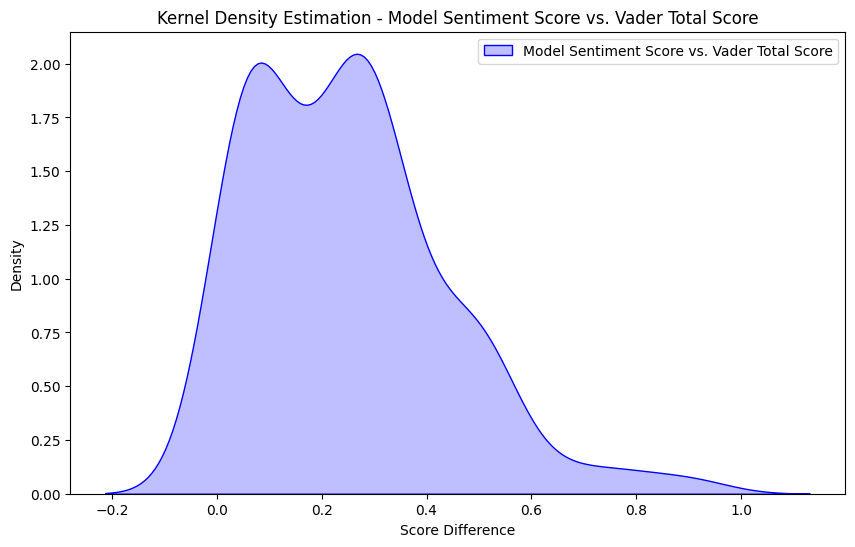

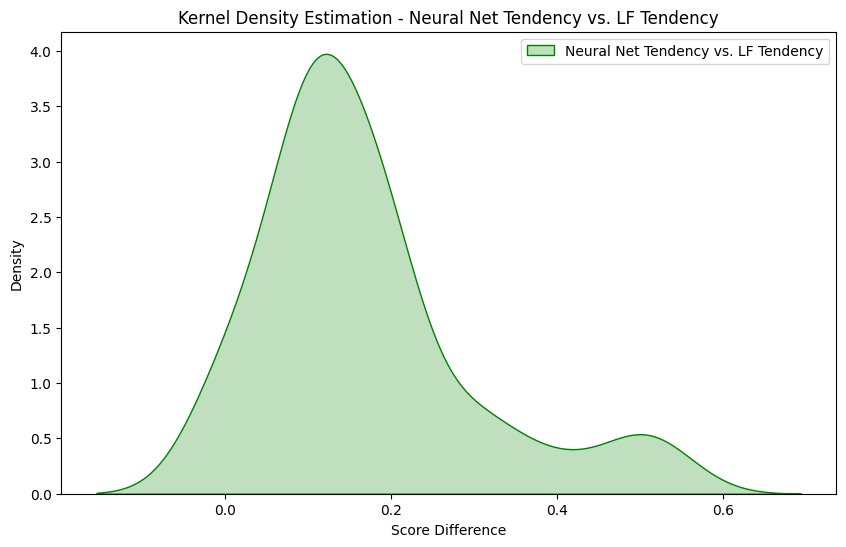

In [22]:
# Convert the 'model_scores' column to a DataFrame
scores_df = pd.DataFrame(df['model_scores'].tolist())

# Calculate the differences
scores_df['model_vader_difference'] = abs(scores_df['model_sentiment_score'] - scores_df['vader_total_score'])
scores_df['neural_net_lf_difference'] = abs(scores_df['neural_net_tendency'] - scores_df['lf_tendency'])

# Plot KDE for Model Sentiment Score vs. Vader Total Score
plt.figure(figsize=(10, 6))
sns.kdeplot(data=scores_df, x='model_vader_difference', fill=True, common_norm=False, color='blue', label='Model Sentiment Score vs. Vader Total Score')
plt.title('Kernel Density Estimation - Model Sentiment Score vs. Vader Total Score')
plt.xlabel('Score Difference')
plt.ylabel('Density')
plt.legend()
plt.show()

# Plot KDE for Neural Net Tendency vs. LF Tendency
plt.figure(figsize=(10, 6))
sns.kdeplot(data=scores_df, x='neural_net_lf_difference', fill=True, common_norm=False, color='green', label='Neural Net Tendency vs. LF Tendency')
plt.title('Kernel Density Estimation - Neural Net Tendency vs. LF Tendency')
plt.xlabel('Score Difference')
plt.ylabel('Density')
plt.legend()
plt.show()

### Our Sentiment Analyzer Seems to be performing adequately based on our defined goals (majority within 0.1, 0.2, 0.3 for sentiment, majority within 0.1, 0.2, 0.3 bias estimator), based on these concentrations. 

## Apply these methods to the larger set... 25000 abstract/headlines concatenated strings!

In [23]:
df_large = pd.read_csv('/Users/ben/Desktop/DSI_GA_Materials/capstone/Capstone_Project_backup/Data/df_with_section_names.csv')

In [24]:
df_large['model_scores'] = df_large['Document'].apply(lambda x: predict_and_display_outcomes(x, combined_binary_bias_score))

Phrase with stopwords removed: see latest charts maps coronavirus cases deaths hospitalizations garfield county montana garfield county montana covid case risk tracker
1/1 [==============================] - 0s 39ms/step
Neural Net Model Tendency Towards Bias Score: 0.20
Labeling Function Outcomes:
Labeling Function Tendency Towards Bias Score: 0.01
None
Phrase with stopwords removed: biggest increases come groups past far less likely babies highly educated women women never married u fertility rate yet women mothers
1/1 [==============================] - 0s 33ms/step
Neural Net Model Tendency Towards Bias Score: 0.20
Labeling Function Outcomes:
Labeling Function Tendency Towards Bias Score: 0.70
None
Phrase with stopwords removed: miguel cardona education secretary said reopening nation schools without addressing time lost learning pandemic would insufficient called schools use federal stimulus funds invest mental health counseling tutoring cardona urges schools invest extra tutoring
1

### Saved outputs as text file for future reference

#### View dataframe to ensure this worked

In [25]:
df_large['model_scores'] 

0        {'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}
1               {'neural_net_tendency': 0.2, 'lf_tendency': 0.7, 'model_sentiment_score': 0.9, 'vader_total_score': 0.0}
2            {'neural_net_tendency': 0.2, 'lf_tendency': 0.4, 'model_sentiment_score': 0.6, 'vader_total_score': 0.2411}
3               {'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.0}
4             {'neural_net_tendency': 0.2, 'lf_tendency': 0.08, 'model_sentiment_score': 0.28, 'vader_total_score': 0.0}
                                                              ...                                                       
25505          {'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.34}
25506      {'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': -0.3, 'vader_total_score': -0.6808}
25507        {'neural_net_tenden

In [ ]:
# viewing the whole data frame

In [29]:
df_large['Category'].value_counts(normalize=True)

Category
U.S.                    0.364239
Opinion                 0.234201
World                   0.131253
Business Day            0.080877
Sports                  0.027325
Health                  0.024385
Science                 0.011722
Podcasts                0.011173
Technology              0.009918
The Upshot              0.009801
New York                0.008821
Arts                    0.008115
Briefing                0.008037
Magazine                0.006547
Travel                  0.006508
Blogs                   0.006469
Multimedia/Photos       0.005920
Books                   0.005645
Food                    0.005606
Climate                 0.005449
Automobiles             0.003999
Your Money              0.003999
Real Estate             0.003371
Style                   0.003175
Sunday Review           0.001999
Well                    0.001490
Fashion & Style         0.001372
Education               0.001255
Times Insider           0.001176
Movies                  0.001098
R

In [28]:
df_large

,Unnamed: 0,Document,Category,model_scores
0,0,see latest charts maps coronavirus cases deaths hospitalizations garfield county montana garfield county montana covid case risk tracker,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}"
1,1,biggest increases come groups past far less likely babies highly educated women women never married u fertility rate yet women mothers,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.7, 'model_sentiment_score': 0.9, 'vader_total_score': 0.0}"
2,2,miguel cardona education secretary said reopening nation schools without addressing time lost learning pandemic would insufficient called schools use federal stimulus funds invest mental health counseling tutoring cardona urges schools invest extra tutoring,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.4, 'model_sentiment_score': 0.6, 'vader_total_score': 0.2411}"
3,3,mohamed morsi egypt first democratically elected president said washington revitalize alliance egypt relations egypt u,Sports,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.0}"
4,4,see full results maps district columbia elections district columbia election results,Sports,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.08, 'model_sentiment_score': 0.28, 'vader_total_score': 0.0}"
...,...,...,...,...
25505,25505,abdicated parental rights duties new societal norm played,Health,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.34}"
25506,25506,overcame desperation felt stepping congress still fight katie hill,The Upshot,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': -0.3, 'vader_total_score': -0.6808}"
25507,25507,former n f l wide receiver joined premier lacrosse league pros sports found opportunities field chris hogan left lacrosse league given others path back,World,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.3, 'model_sentiment_score': 0.5, 'vader_total_score': 0.3818}"
25508,25508,placing tracking devices netbooks discarded cellphones batteries printer cartridges researchers tracked paths e waste across nation well developing countries global pinball game tracking e waste,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.4, 'model_sentiment_score': -0.6, 'vader_total_score': -0.7096}"


### KDE function

In [26]:
# Convert the 'model_scores' column to a DataFrame
scores_df = pd.DataFrame(df_large['model_scores'].tolist())

# Define the ranges for comparison
score_ranges = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0] 

# Initialize counters for each range
model_sentiment_counts = {range_val: 0 for range_val in score_ranges}
neural_net_counts = {range_val: 0 for range_val in score_ranges}

# Iterate through the rows of the DataFrame
for index, row in scores_df.iterrows():
    for range_val in score_ranges:
        # Check if 'model_sentiment_score' is within the range of 'vader_total_score'
        if abs(row['model_sentiment_score'] - row['vader_total_score']) <= range_val:
            model_sentiment_counts[range_val] += 1

        # Check if 'neural_net_tendency' is within the range of 'lf_tendency'
        if abs(row['neural_net_tendency'] - row['lf_tendency']) <= range_val:
            neural_net_counts[range_val] += 1

# Display the counts for each range
print("Model Sentiment Score vs. Vader Total Score:")
print(model_sentiment_counts)

print("\nNeural Net Tendency vs. LF Tendency:")
print(neural_net_counts)


Model Sentiment Score vs. Vader Total Score:
{0.1: 6137, 0.2: 10233, 0.3: 17876, 0.4: 20908, 0.5: 23133, 0.6: 24317, 0.7: 25010, 0.8: 25264, 0.9: 25437, 1.0: 25497}

Neural Net Tendency vs. LF Tendency:
{0.1: 12632, 0.2: 20636, 0.3: 22773, 0.4: 23880, 0.5: 24871, 0.6: 25089, 0.7: 25506, 0.8: 25510, 0.9: 25510, 1.0: 25510}


### Visualize the difference

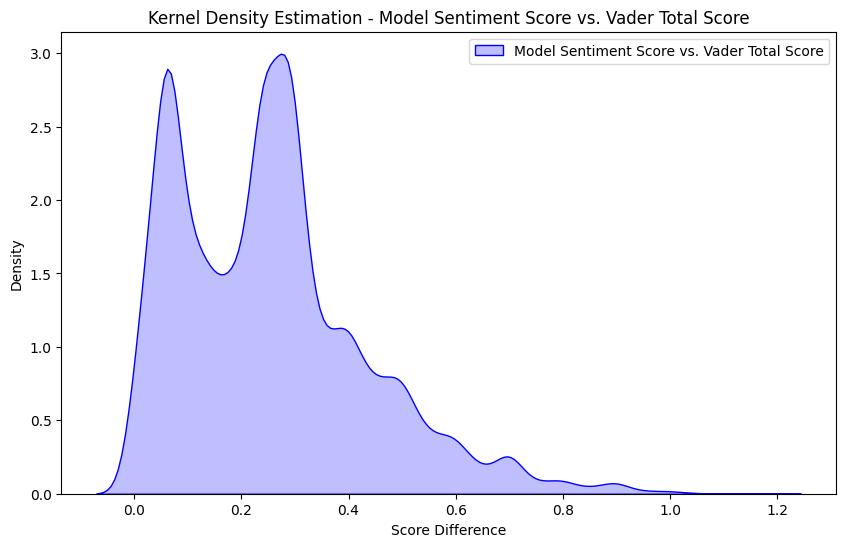

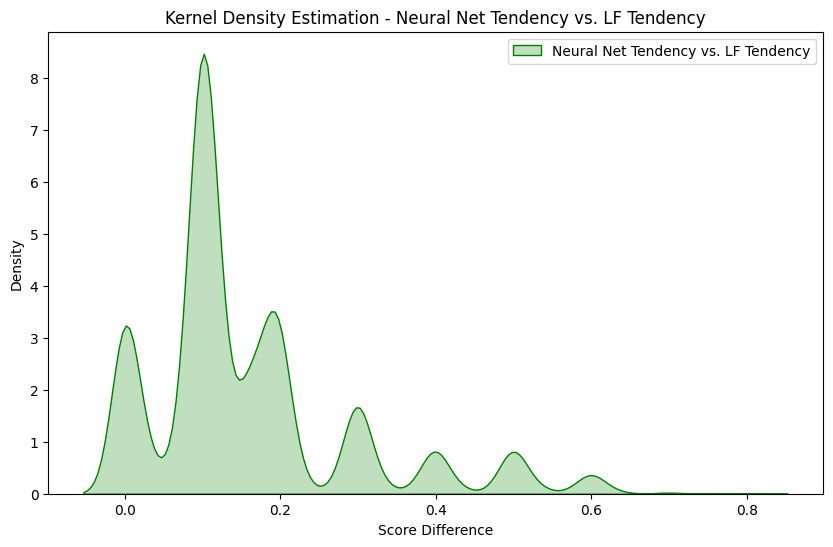

In [27]:
# Convert the 'model_scores' column to a DataFrame
scores_df = pd.DataFrame(df_large['model_scores'].tolist())

# Calculate the differences
scores_df['model_vader_difference'] = abs(scores_df['model_sentiment_score'] - scores_df['vader_total_score'])
scores_df['neural_net_lf_difference'] = abs(scores_df['neural_net_tendency'] - scores_df['lf_tendency'])

# Plot KDE for Model Sentiment Score vs. Vader Total Score
plt.figure(figsize=(10, 6))
sns.kdeplot(data=scores_df, x='model_vader_difference', fill=True, common_norm=False, color='blue', label='Model Sentiment Score vs. Vader Total Score')
plt.title('Kernel Density Estimation - Model Sentiment Score vs. Vader Total Score')
plt.xlabel('Score Difference')
plt.ylabel('Density')
plt.legend()
plt.show()

# Plot KDE for Neural Net Tendency vs. LF Tendency
plt.figure(figsize=(10, 6))
sns.kdeplot(data=scores_df, x='neural_net_lf_difference', fill=True, common_norm=False, color='green', label='Neural Net Tendency vs. LF Tendency')
plt.title('Kernel Density Estimation - Neural Net Tendency vs. LF Tendency')
plt.xlabel('Score Difference')
plt.ylabel('Density')
plt.legend()
plt.show()

### We can be assured that our model may still be improved with better hardware and team resources. There is potential for further improvement but by the standards we have set our models are performing closely within error bounds (0.1, 0.2, 0.3) for Neural Network model validated against labeling function and our sentiment analyzer validateed against VADER's sentiment analyzer.  

# A/B Testing
### The null hypothesis states that there is no significant difference between the Opinion section sentiment differences versus the other sections sentiment differences in the publication, where these differences are calculated between our analyzer and VADER's sentiment analyzer. We assert that we will end up rejecting this hypothesis and that there is signficant difference between these distinct section groups (Opinion versus non-Opinion), where our $\alpha$ level is $0.1$. 

In [32]:
df_large['sent_score_diff'] = df_large.apply(lambda row: abs(row['model_scores']['model_sentiment_score'] - row['model_scores']['vader_total_score']), axis=1)


In [33]:
df_large

,Unnamed: 0,Document,Category,model_scores,sent_score_diff
0,0,see latest charts maps coronavirus cases deaths hospitalizations garfield county montana garfield county montana covid case risk tracker,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.01, 'model_sentiment_score': -0.21, 'vader_total_score': -0.2732}",0.0632
1,1,biggest increases come groups past far less likely babies highly educated women women never married u fertility rate yet women mothers,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.7, 'model_sentiment_score': 0.9, 'vader_total_score': 0.0}",0.9000
2,2,miguel cardona education secretary said reopening nation schools without addressing time lost learning pandemic would insufficient called schools use federal stimulus funds invest mental health counseling tutoring cardona urges schools invest extra tutoring,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.4, 'model_sentiment_score': 0.6, 'vader_total_score': 0.2411}",0.3589
3,3,mohamed morsi egypt first democratically elected president said washington revitalize alliance egypt relations egypt u,Sports,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.0}",0.3000
4,4,see full results maps district columbia elections district columbia election results,Sports,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.08, 'model_sentiment_score': 0.28, 'vader_total_score': 0.0}",0.2800
...,...,...,...,...,...
25505,25505,abdicated parental rights duties new societal norm played,Health,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': 0.3, 'vader_total_score': 0.34}",0.0400
25506,25506,overcame desperation felt stepping congress still fight katie hill,The Upshot,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.1, 'model_sentiment_score': -0.3, 'vader_total_score': -0.6808}",0.3808
25507,25507,former n f l wide receiver joined premier lacrosse league pros sports found opportunities field chris hogan left lacrosse league given others path back,World,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.3, 'model_sentiment_score': 0.5, 'vader_total_score': 0.3818}",0.1182
25508,25508,placing tracking devices netbooks discarded cellphones batteries printer cartridges researchers tracked paths e waste across nation well developing countries global pinball game tracking e waste,Opinion,"{'neural_net_tendency': 0.2, 'lf_tendency': 0.4, 'model_sentiment_score': -0.6, 'vader_total_score': -0.7096}",0.1096


In [40]:
df_large.dtypes

Unnamed: 0           int64
Document            object
Category            object
model_scores        object
sent_score_diff    float64
dtype: object

In [41]:
category_filter = 'Opinion'  # Replace with the category you are interested in
group_opinion = df_large[df_large['Category'] == str(category_filter)]['sent_score_diff']
group_non_opinion = df_large[df_large['Category'] != str(category_filter)]['sent_score_diff']

In [42]:
group_opinion

0        0.0632
1        0.9000
2        0.3589
13       0.1785
20       0.0980
          ...  
25490    0.2094
25493    0.0500
25494    0.1719
25508    0.1096
25509    0.1994
Name: sent_score_diff, Length: 5974, dtype: float64

In [43]:
group_non_opinion

3        0.3000
4        0.2800
5        0.3797
6        0.2900
7        0.1274
          ...  
25503    0.5423
25504    0.4064
25505    0.0400
25506    0.3808
25507    0.1182
Name: sent_score_diff, Length: 19536, dtype: float64

In [45]:
# Perform Mann-Whitney U test - since the values are non-normally distributed (See Kernel Density Estimate graphs)
statistic, p_value = mannwhitneyu(group_opinion, group_non_opinion, alternative='two-sided')
'''
# Set significance level (alpha): We chose 0.1, which means that the researcher is willing to 
# accept a 10% chance of making a Type I error (incorrectly rejecting a true null hypothesis).
'''
alpha = 0.1

# Analyze results
if p_value <= alpha:
    print(f"Reject the null hypothesis. There is a significant difference (p-value: {p_value:.4f})")
else:
    print(f"Fail to reject the null hypothesis. No significant difference (p-value: {p_value:.4f})")

Reject the null hypothesis. There is a significant difference (p-value: 0.0976)


### Thus, we reject the null hypothesis and assert that there is significant difference between the sentiment differences between our model versus VADER's analyzer for Opinion section versus non-Opinion section. In other words, we are in fact able to distinguish between Opinion versus non-Opinion section abstract/headline couplings by looking at the absolute differences between BEAST and VADER scores with under a $10\%$ chance of being incorrect. 

### The significance of this result confirms that we are able to distinguish between Opinion section articles versus non-Opinion section articles based on sentiment, and in a way this further asserts our ability to distinguish between certain forms of tendency towards bias based on article category, and further analysis of the actual content of the abstracts/headlines once inserted into our Tendency Towards Bias Scoring App. 

### Perform this test on the scores themselves not the differences

In [47]:
# Extract 'model_sentiment_score' values from the 'model_scores' column
df_large['model_sentiment_score'] = df_large['model_scores'].apply(lambda x: x['model_sentiment_score'])

# Separate into Opinion and non-Opinion groups
group_opinion = df_large[df_large['Category'] == 'Opinion']['model_sentiment_score']
group_non_opinion = df_large[df_large['Category'] != 'Opinion']['model_sentiment_score']

# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(group_opinion, group_non_opinion, alternative='two-sided')

# Print the Mann-Whitney U test results
print("Mann-Whitney U Test Results:")
print(f"Statistic: {statistic}")
print(f"P-value: {p_value}")

# Check if the p-value is less than alpha (0.05, for example) to determine statistical significance
alpha = 0.1
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between Opinion and non-Opinion groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between Opinion and non-Opinion groups.")

Mann-Whitney U Test Results:
Statistic: 58321622.0
P-value: 0.9479872352131251
Fail to reject the null hypothesis. There is no significant difference between Opinion and non-Opinion groups.


In [48]:
# Extract 'model_sentiment_score' values from the 'model_scores' column
df_large['vader_total_score'] = df_large['model_scores'].apply(lambda x: x['vader_total_score'])

# Separate into Opinion and non-Opinion groups
group_opinion = df_large[df_large['Category'] == 'Opinion']['vader_total_score']
group_non_opinion = df_large[df_large['Category'] != 'Opinion']['vader_total_score']

# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(group_opinion, group_non_opinion, alternative='two-sided')

# Print the Mann-Whitney U test results
print("Mann-Whitney U Test Results:")
print(f"Statistic: {statistic}")
print(f"P-value: {p_value}")

# Check if the p-value is less than alpha (0.05, for example) to determine statistical significance
alpha = 0.1
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between Opinion and non-Opinion groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between Opinion and non-Opinion groups.")

Mann-Whitney U Test Results:
Statistic: 58671906.0
P-value: 0.5208986842130727
Fail to reject the null hypothesis. There is no significant difference between Opinion and non-Opinion groups.


### We fail to reject the null hypothesis, there is no significant difference between Opinion and non-Opinion groups in terms of sentiment either from our analyzer alone nor VADER's analyzer alone. This is in line with what we would expect given that it is very hard by itself to determine which section in the publication a given abstract/headline belonged to based on sentiment alone. 

# To Summarize: 
1. Objective: We aimed to compare the absolute sentiment difference between your model and VADER's analyzer for articles in the Opinion versus non-Opinion sections.
2. Method: We computed the absolute differences between `model_sentiment_score` and `vader_total_score` for each article. Then, we divided the dataset into `Opinion` and `non-Opinion` categories.
3. Statistical Test: We conducted a Mann-Whitney U test to compare the distributions of these absolute differences between `Opinion` and `non-Opinion` categories.
4. Result: The p-value obtained from the test was $0.0976$, which is less than our chosen $\alpha$ significance level of $0.1$.
5. Conclusion: With a p-value less than $\alpha$, we rejected the null hypothesis. This implies that there was a statistically significant difference in the absolute sentiment differences of BEAST's and VADER's analyzer for distinguishing between `Opinion` versus `non-Opinion` sections.
6. This conclusion suggests that there is evidence to support that the absolute differences between our model and VADER's analyzer vary significantly depending on whether the articles are from the `Opinion` or `non-Opinion` sections. In this way we can determine if the article came from an `Opinion` section versus `non-Opinion` section based on absolute differences between analyzers alone. However, we may also utilize our binary classification model without having to rely upon sentiment information. 
7. Done individually, these scores ALONE provided no statistically significant information regarding whether, based on score alone from either analyzer, a given abstract/headline originated from an article in the `Opinion` section nor an article from the `non-Opinion` section. 

Moreover, paired with one of our classification models, depending on which one was chosen, there would be a $95\%$ specificity rate and you would be able to distinguish which category these abstracts/headlines came from with only a $\sim 10\%$ of being incorrect (the current misclassification rate). When we put all of these classification models, neural network models, and sentiment analyzers together the results are incredibly promising as we begin to understand how tendency towards bias may be understood. 